In [ ]:
%cd images
!wget http://image.shutterstock.com/display_pic_with_logo/510586/273973283/stock-photo-scenic-view-of-beautiful-bright-sunset-with-birds-flock-silhouettes-above-sea-surface-273973283.jpg
%cd ..

# **Lab 2.1 Image Enhancement with Math Operation**
This lab consists of two main subparts: Image Pixel Adjustment using Linear Equations and Gamma Equations.

In [ ]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
from mpl_toolkits.axes_grid1 import ImageGrid
import os
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

Read an image using OpenCV (Use your own image).

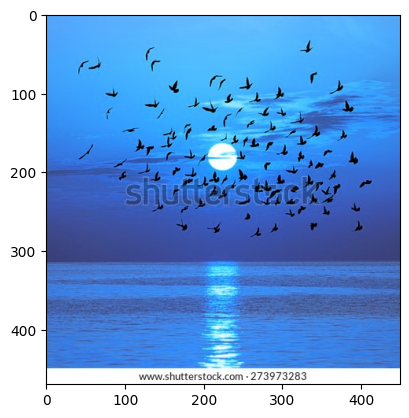

In [ ]:
### START CODE HERE ###
img = cv2.imread("/content/images/stock-photo-scenic-view-of-beautiful-bright-sunset-with-birds-flock-silhouettes-above-sea-surface-273973283.jpg")


plt.imshow(img)
### END CODE HERE ###

## **Image Pixel Adjustment**

### Using Linear Equation
$$I_{new} = I \cdot a + b$$

Please perform at ***least 20 iterations*** with varying values of $a$ and $b$.
Assign the result of each iteration to an array.<br/>

In [ ]:
### START CODE HERE ###
# Convert the image to grayscale

a = 0
b = 0
lin_result = []
for i in range(20):

    a = i * (3/19)

    img_new = img * a + b

    img_new = np.clip(img_new, 0, 255).astype(np.uint8)
    lin_result.append(cv2.cvtColor(img_new, cv2.COLOR_BGR2RGB))

### END CODE HERE ###

Plot the images in a grid as shown below. Using `ImageGrid`.
<details>

<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

- The output should resemble this, but not be identical
- The reference output used 40 iterations.

![image-2.png](https://raw.githubusercontent.com/Digital-Image-Processing-Laboratory/Image-Processing-Course-2025/main/Lab2_Image-Enhancement/assets/1-1.png?raw=true)
</details>


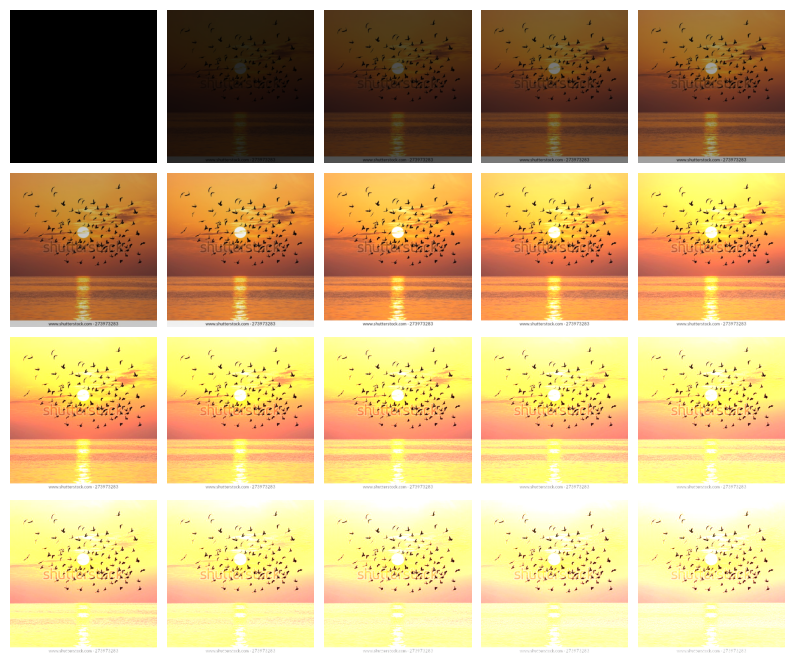

In [ ]:
### START CODE HERE ###
fig = plt.figure(figsize=(10., 10.))
grid = ImageGrid(fig, 111,  # similar to subplot(111)
                 nrows_ncols=(4, 5),  # creates 2x2 grid of axes
                 axes_pad=0.1,  # pad between axes in inch.
                 )

for ax, im in zip(grid, lin_result):
    # Iterating over the grid returns the Axes objects.
    ax.imshow(im, cmap='gray')
    ax.axis('off')


plt.show()
### END CODE HERE ###

If you code work properly, the cell below should run without error.

In [ ]:
assert len(lin_result) >= 20, f"Expected more than or equal 20 iterations but got {len(lin_result)}"
for idx, result in enumerate(lin_result):
    assert result.shape == img.shape, f"Shape mismatch at index {idx}. Expected {img.shape} but got {result.shape}"
    assert result.dtype == np.uint8, f"Data type mismatch at index {idx}. Expected uint8 but got {result.dtype}"
    assert np.all((result >= 0) & (result <= 255)), f"Pixel value out of bounds at index {idx}"

Save the array of images to a video. Please complete the function below.

In [ ]:
### START CODE HERE ###
def write_images_to_video(image_array, output_file, frame_rate=30):
    height, width, _ = image_array[0].shape
    fourcc = cv2.VideoWriter_fourcc(*'mp4v') # Use 'mp4v' for .mp4 files
    out = cv2.VideoWriter(output_file, fourcc, frame_rate, (width, height))

    for image in image_array:
      out.write(image)
### END CODE HERE ###

Use `write_images_to_video()` and save the result.

In [ ]:
output_folder = "output"
os.makedirs(output_folder, exist_ok=True)

output_file =  os.path.join(output_folder, "output_linear.mp4")
write_images_to_video(lin_result,output_file)

Now use `matplotlib.animation` to display the animation from the images array.

In [ ]:
%%capture
### START CODE HERE ###
fig, ax = plt.subplots()
imgs = []
for imgage in lin_result:
    im = ax.imshow(imgage, animated=True)
    imgs.append([im])

ani = animation.ArtistAnimation(fig, imgs, interval=50, blit=True, repeat_delay=1000)
plt.close(fig) # Close the figure to prevent it from being displayed twice
### END CODE HERE ###

<details>
<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

- The output should resemble this, but not be identical

![linear.gif](![<attachment:linear (2).gif>](https://raw.githubusercontent.com/Digital-Image-Processing-Laboratory/Image-Processing-Course-2025/main/Lab2_Image-Enhancement/assets/linear.gif?raw=true))

</details>

In [ ]:
display(HTML(ani.to_jshtml()))

### Gamma Equation
$$I_{new} = I^{\gamma} \cdot a + b$$

Where $a$ is 1 and $b$ is 0.
Please perform ***at least 10 iterations*** for 0 < $\gamma$ < 1 and another ***at least 10 iterations*** for $\gamma$ > 1
Assign the result of each iteration to an array.<br/>


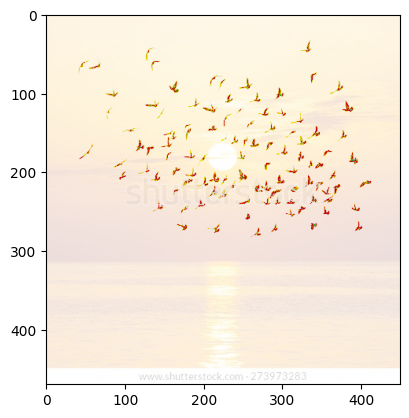

In [ ]:
gamma = 0.1
img_new = (cv2.cvtColor(img,cv2.COLOR_BGR2RGB) ** gamma)/(255**gamma)*255
plt.imshow(np.clip(img_new, 0, 255).astype(np.uint8))

In [ ]:
### START CODE HERE ###
a = 1
b = 0
gamma = 0.1

gam_result = []
for i in range(20):
  img_new = (img**gamma)/(255**gamma)*255
  img_new = np.round(img_new).astype(np.uint8)
  gam_result.append(cv2.cvtColor(img_new,cv2.COLOR_BGR2RGB))
  gamma += 1.9/20
  if gamma > 1.0:
    gamma += 1.9/10
### END CODE HERE ###

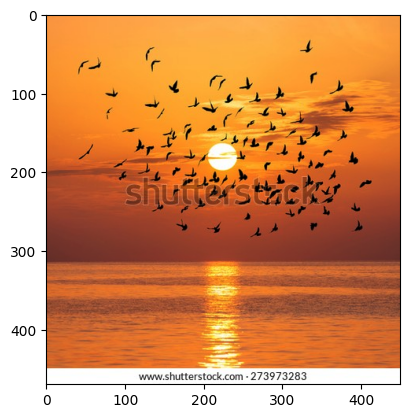

In [ ]:
plt.imshow(gam_result[10])

Plot the images in a grid as shown below. Using `ImageGrid`.
<details>

<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

- The output should resemble this, but not be identical

![image-2.png](https://raw.githubusercontent.com/Digital-Image-Processing-Laboratory/Image-Processing-Course-2025/main/Lab2_Image-Enhancement/assets/1-2.png?raw=true)
</details>

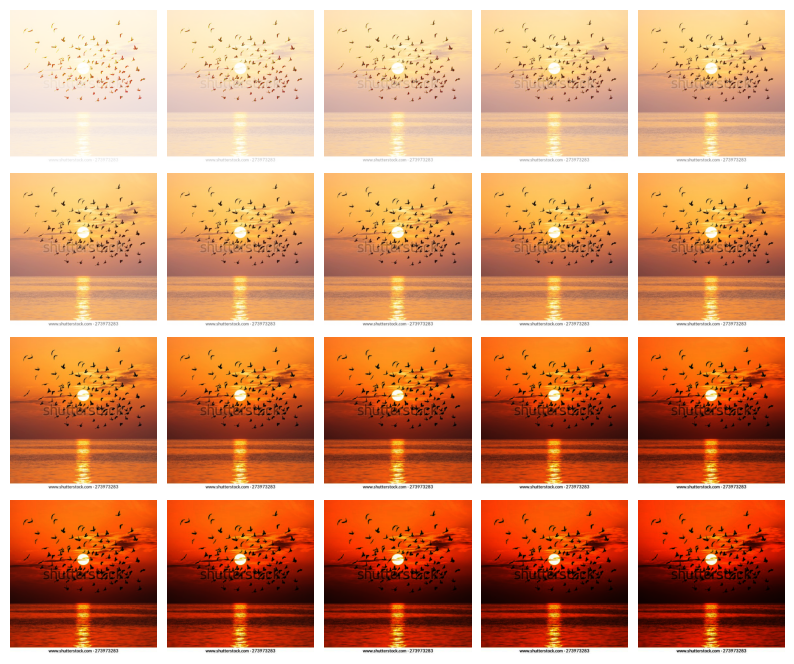

In [ ]:
### START CODE HERE ###
fig = plt.figure(figsize=(10., 10.))
grid = ImageGrid(fig, 111,  # similar to subplot(111)
                 nrows_ncols=(4, 5),  # creates 4x5 grid of axes
                 axes_pad=0.1,  # pad between axes in inch.
                 )

for ax, im in zip(grid, gam_result):
    # Iterating over the grid returns the Axes objects.
    ax.imshow(im)
    ax.axis('off')


plt.show()
### END CODE HERE ###

In [ ]:
assert len(gam_result) >= 20, f"more than or equal 20 iterations but got {len(gam_result)}"
for idx, result in enumerate(gam_result):
    assert result.shape == img.shape, f"Shape mismatch at index {idx}. Expected {img.shape} but got {result.shape}"
    assert result.dtype == np.uint8, f"Data type mismatch at index {idx}. Expected uint8 but got {result.dtype}"
    assert np.all((result >= 0) & (result <= 255)), f"Pixel value out of bounds at index {idx}"

Use `write_images_to_video()` and save the result.

In [ ]:
output_folder = "output"
os.makedirs(output_folder, exist_ok=True)

output_file =  os.path.join(output_folder, "output_gamma.mp4")
write_images_to_video(gam_result,output_file)

Now use `matplotlib.animation` to display the animation from the images array.

In [ ]:
%%capture
### START CODE HERE ###
fig, ax = plt.subplots()
imgs = []
for image in gam_result:
  im = ax.imshow(image, animated = True)
  imgs.append([im])

ani = animation.ArtistAnimation(fig, imgs, interval=50, blit=True, repeat_delay=4000)
### END CODE HERE ###

<details>
<summary>
<font size="3" color="orange">
<b>Expected output</b>
</font>
</summary>

- The output should resemble this, but not be identical

![gamma2.gif](https://raw.githubusercontent.com/Digital-Image-Processing-Laboratory/Image-Processing-Course-2025/main/Lab2_Image-Enhancement/assets/gamma.gif?raw=true)

</details>

In [ ]:
display(HTML(ani.to_jshtml()))

---

## **Questions**
1. If an image having over brightness or saturation, what would be possible solutions to enhance the image.
2. How can we make an image reverse intensity (black-to-white, white-to-black)? Explain the process